In [1]:
import pandas as pd
gdp_percentage = pd.read_excel("D:\MACHINE LEARNING\GDP_GROWTH( % annual).xls", header = 3, sheet_name ="Data" )
short_term_debt= pd.read_excel("D:\MACHINE LEARNING\Short-term debt (% of total reserves).xls", header = 3, sheet_name ="Data" )
externaldebt =  pd.read_excel("D:\MACHINE LEARNING\External debt stocks (% of GNI).xls", header = 3, sheet_name ="Data" )
total_resever = pd.read_excel("D:\MACHINE LEARNING\Total reserves (% of total external debt).xls", header = 3, sheet_name ="Data" )
CPI = pd.read_excel("D:\MACHINE LEARNING\CPI %.xls", header = 3, sheet_name ="Data" )
unemployment = pd.read_excel("D:\MACHINE LEARNING\\unemployment2.xls", header = 3, sheet_name ="Data" )

E:\Anaconda\lib\site-packages\pandas\core\computation\expressions.py:21: UserWarning: Pandas requires version '2.8.4' or newer of 'numexpr' (version '2.8.1' currently installed).
  from pandas.core.computation.check import NUMEXPR_INSTALLED
E:\Anaconda\lib\site-packages\pandas\core\arrays\masked.py:60: UserWarning: Pandas requires version '1.3.6' or newer of 'bottleneck' (version '1.3.4' currently installed).
  from pandas.core import (


In [2]:
# Chọn tất cả các cột ngoại trừ các cột năm từ "1960" đến "2023"
columns_to_keep = gdp_percentage.columns.difference([str(year) for year in range(1960, 2024)])

# Đảo ngược các cột từ "1960" đến "2023" thành các dòng
gdp_percentage_melted = gdp_percentage.melt(id_vars=columns_to_keep, var_name="Year", value_name="GDP_Percentage", 
                                             value_vars=[str(year) for year in range(1960, 2024)])

In [3]:
# Đảm bảo chỉ mục của DataFrame được đặt lại sau khi lọc
gdp_percentage_melted = gdp_percentage_melted.reset_index(drop=True)

# Lọc ra các dòng có "Country Name" trong danh sách quốc gia Đông Nam Á
southeast_asia_countries = [
    "Brunei Darussalam", "Cambodia", "Indonesia", "Lao PDR", "Malaysia",
    "Myanmar", "Philippines", "Singapore", "Thailand", "Timor-Leste", "Viet Nam"
]
gdp_percentage_melted = gdp_percentage_melted[gdp_percentage_melted["Country Name"].isin(southeast_asia_countries)]

# Lọc dữ liệu từ năm 1991 đến 2022
# Chuyển đổi kiểu dữ liệu của cột "Year" sang số nguyên

gdp_percentage_melted["Year"] = gdp_percentage_melted["Year"].astype(int)
gdp_percentage_melted = gdp_percentage_melted[(gdp_percentage_melted["Year"] >= 1991) & (gdp_percentage_melted["Year"] <= 2022)]



In [4]:
import pandas as pd

# Định nghĩa danh sách các DataFrame và đường dẫn đến tệp Excel
dataframes = {
    "short_term_debt": short_term_debt,
    "external_debt": externaldebt,
    "total_reserves": total_resever,
    "cpi": CPI,
    "unemployment": unemployment,
    "gdp_percentage": gdp_percentage
}

# Định nghĩa danh sách các quốc gia trên thế giới
recognized_countries = [
    "Afghanistan", "Albania", "Algeria", "Andorra", "Angola", "Antigua and Barbuda", "Argentina", "Armenia", "Australia", "Austria",
    "Azerbaijan", "Bahamas", "Bahrain", "Bangladesh", "Barbados", "Belarus", "Belgium", "Belize", "Benin", "Bhutan",
    "Bolivia", "Bosnia and Herzegovina", "Botswana", "Brazil", "Brunei", "Bulgaria", "Burkina Faso", "Burundi", "Cabo Verde", "Cambodia",
    "Cameroon", "Canada", "Central African Republic", "Chad", "Chile", "China", "Colombia", "Comoros", "Congo, Democratic Republic of the", "Congo, Republic of the",
    "Costa Rica", "Croatia", "Cuba", "Cyprus", "Czech Republic", "Denmark", "Djibouti", "Dominica", "Dominican Republic", "East Timor (Timor-Leste)",
    "Ecuador", "Egypt", "El Salvador", "Equatorial Guinea", "Eritrea", "Estonia", "Eswatini", "Ethiopia", "Fiji", "Finland",
    "France", "Gabon", "Gambia", "Georgia", "Germany", "Ghana", "Greece", "Grenada", "Guatemala", "Guinea",
    "Guinea-Bissau", "Guyana", "Haiti", "Honduras", "Hungary", "Iceland", "India", "Indonesia", "Iran", "Iraq",
    "Ireland", "Israel", "Italy", "Ivory Coast", "Jamaica", "Japan", "Jordan", "Kazakhstan", "Kenya", "Kiribati",
    "Korea, North", "Korea, South", "Kosovo", "Kuwait", "Kyrgyzstan", "Laos", "Latvia", "Lebanon", "Lesotho", "Liberia",
    "Libya", "Liechtenstein", "Lithuania", "Luxembourg", "Madagascar", "Malawi", "Malaysia", "Maldives", "Mali", "Malta",
    "Marshall Islands", "Mauritania", "Mauritius", "Mexico", "Micronesia", "Moldova", "Monaco", "Mongolia", "Montenegro", "Morocco",
    "Mozambique", "Myanmar", "Namibia", "Nauru", "Nepal", "Netherlands", "New Zealand", "Nicaragua", "Niger", "Nigeria",
    "North Macedonia", "Norway", "Oman", "Pakistan", "Palau", "Palestine", "Panama", "Papua New Guinea", "Paraguay", "Peru",
    "Philippines", "Poland", "Portugal", "Qatar", "Romania", "Russia", "Rwanda", "Saint Kitts and Nevis", "Saint Lucia", "Saint Vincent and the Grenadines",
    "Samoa", "San Marino", "Sao Tome and Principe", "Saudi Arabia", "Senegal", "Serbia", "Seychelles", "Sierra Leone", "Singapore", "Slovakia",
    "Slovenia", "Solomon Islands", "Somalia", "South Africa", "South Sudan", "Spain", "Sri Lanka", "Sudan", "Suriname", "Sweden",
    "Switzerland", "Syria", "Taiwan", "Tajikistan", "Tanzania", "Thailand", "Togo", "Tonga", "Trinidad and Tobago", "Tunisia",
    "Turkey", "Turkmenistan", "Tuvalu", "Uganda", "Ukraine", "United Arab Emirates", "United Kingdom", "United States", "Uruguay", "Uzbekistan",
    "Vanuatu", "Vatican City (Holy See)","Russian Federation", "Venezuela, RB", "Viet Nam", "Yemen", "Zambia", "Zimbabwe","Korea, Rep.","Hong Kong SAR, China"
]

# Danh sách các cột chung
common_columns = ["Country Code", "Country Name", "Year"]

# List để lưu trữ các DataFrame đã xử lý
processed_dfs = []

# Duyệt qua từng DataFrame và thực hiện xử lý
for name, df in dataframes.items():
    # Chọn tất cả các cột ngoại trừ các cột năm từ "1960" đến "2023"
    columns_to_keep = df.columns.difference([str(year) for year in range(1960, 2024)])

    # Đảo ngược các cột từ "1960" đến "2023" thành các dòng
    melted_df = df.melt(id_vars=columns_to_keep, var_name="Year", value_name=name,
                        value_vars=[str(year) for year in range(1960, 2024)])

    # Đảm bảo chỉ mục của DataFrame được đặt lại sau khi lọc
    melted_df = melted_df.reset_index(drop=True)

    # Lọc ra các dòng có "Country Name" trong danh sách quốc gia được công nhận trên thế giới
    melted_df = melted_df[melted_df["Country Name"].isin(recognized_countries)]

    # Lọc dữ liệu từ năm 1991 đến 2022 và chuyển đổi kiểu dữ liệu của cột "Year" sang số nguyên
    melted_df["Year"] = melted_df["Year"].astype(int)
    melted_df = melted_df[(melted_df["Year"] >= 1991) & (melted_df["Year"] <= 2023)]

    # Xóa cột "Indicator Code" và "Indicator Name" nếu tồn tại
    if "Indicator Code" in melted_df.columns:
        melted_df.drop(columns=["Indicator Code", "Indicator Name"], inplace=True)

    # Thêm DataFrame đã xử lý vào danh sách
    processed_dfs.append(melted_df)

# Gộp tất cả các DataFrame lại với nhau dựa trên các cột chung
merged_df = pd.concat(processed_dfs, axis=1)

# Chỉ chọn các cột duy nhất từ các DataFrame (tránh trùng lặp)
merged_df = merged_df.loc[:, ~merged_df.columns.duplicated()]





In [5]:
merged_df['financial crisis'] = 0

Text(0.5, 1.0, 'Total Missing Values')

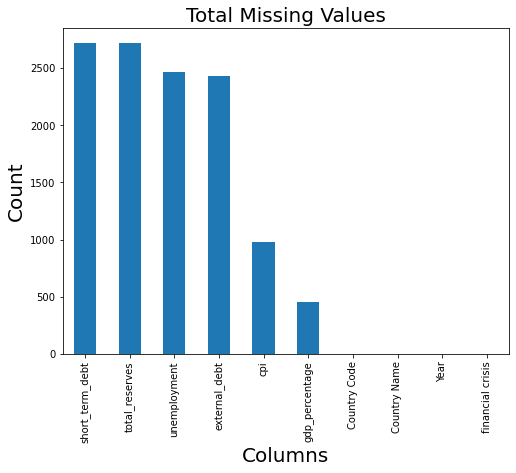

In [6]:
import matplotlib.pyplot as plt
total = merged_df.isnull().sum().sort_values(ascending=False)
total_select = total.head(20)
total_select.plot(kind="bar", figsize = (8,6), fontsize = 10)

plt.xlabel("Columns", fontsize = 20)
plt.ylabel("Count", fontsize = 20)
plt.title("Total Missing Values", fontsize = 20)

In [7]:
#Khủng Hoảng Tài Chính Châu Á (1997-1998)
# Danh sách các quốc gia trong khủng hoảng năm 1997 và 1998
crisis_countries = ["Thailand", "Indonesia", "Korea, Rep.", "Malaysia", "Philippines", "Hong Kong SAR, China", "Singapore", "Japan"]
# Đánh dấu các quốc gia trong danh sách khủng hoảng cho năm 1997 và 1998 là 1
merged_df.loc[(merged_df["Year"].isin([1997, 1998])) & (merged_df["Country Name"].isin(crisis_countries)), "financial crisis"] = 1
# Danh sách các quốc gia trong cuộc khủng hoảng kinh tế ở Ấn Độ năm 1991
india_crisis_countries = ["India"]
# Đánh dấu các quốc gia trong danh sách khủng hoảng cho năm 1991 là 1
merged_df.loc[(merged_df["Year"] == 1991) & (merged_df["Country Name"].isin(india_crisis_countries)), "financial crisis"] = 1
# Danh sách các quốc gia trong cuộc khủng hoảng tài chính toàn cầu năm 2007-2008
global_financial_crisis_countries = ["Japan", "Korea, Rep.", "China", "India", "Singapore", "Hong Kong SAR, China", "Malaysia", 
                                      "Thailand", "Indonesia", "Viet Nam", "Taiwan"]
# Đánh dấu các quốc gia trong danh sách khủng hoảng cho năm 2007-2008 là 1
merged_df.loc[(merged_df["Year"].isin([2007, 2008])) & (merged_df["Country Name"].isin(global_financial_crisis_countries)), "financial crisis"] = 1
# Danh sách các quốc gia trong cuộc khủng hoảng nợ công ở Trung Quốc năm 2020-2021
china_debt_crisis_countries = ["China", "Hong Kong SAR, China", "Singapore", "Indonesia", "India", "Philippines", "Thailand"]

# Đánh dấu các quốc gia trong danh sách khủng hoảng cho năm 2020-2021 là 1
merged_df.loc[(merged_df["Year"].isin([2020, 2021])) & (merged_df["Country Name"].isin(china_debt_crisis_countries)), "financial crisis"] = 1
# Danh sách các quốc gia trong cuộc khủng hoảng kinh tế ở Sri Lanka năm 2022
sri_lanka_crisis_countries = ["Sri Lanka", "Pakistan", "Maldives", "Bangladesh", "Nepal"]

# Đánh dấu các quốc gia trong danh sách khủng hoảng cho năm 2022 là 1
merged_df.loc[(merged_df["Year"] == 2022) & (merged_df["Country Name"].isin(sri_lanka_crisis_countries)), "financial crisis"] = 1
# Danh sách các quốc gia trong cuộc khủng hoảng tài chính ở Myanmar năm 2021-2022
myanmar_crisis_countries = ["Myanmar"]

# Đánh dấu các quốc gia trong danh sách khủng hoảng cho năm 2021-2022 là 1
merged_df.loc[(merged_df["Year"].isin([2021, 2022])) & (merged_df["Country Name"].isin(myanmar_crisis_countries)), "financial crisis"] = 1
# Danh sách các quốc gia trong cuộc khủng hoảng tài chính Châu Âu từ năm 2010 đến 2012
europe_crisis_countries = ["Greece", "Ireland", "Portugal", "Spain", "Italy"]

# Đánh dấu các quốc gia trong danh sách khủng hoảng cho năm 2010-2012 là 1
merged_df.loc[(merged_df["Year"].isin([2010, 2011, 2012])) & (merged_df["Country Name"].isin(europe_crisis_countries)), "financial crisis"] = 1
# Danh sách các quốc gia trong cuộc khủng hoảng tài chính ở Bồ Đào Nha từ năm 2010 đến 2014
portugal_crisis_countries = ["Portugal"]

# Đánh dấu quốc gia Bồ Đào Nha trong danh sách khủng hoảng cho năm 2010-2014 là 1
merged_df.loc[(merged_df["Year"].isin(range(2010, 2015))) & (merged_df["Country Name"].isin(portugal_crisis_countries)), "financial crisis"] = 1
# Danh sách các quốc gia trong cuộc khủng hoảng tài chính ở Tây Ban Nha từ năm 2008 đến 2014
spain_crisis_countries = ["Spain"]

# Đánh dấu quốc gia Tây Ban Nha trong danh sách khủng hoảng cho năm 2008-2014 là 1
merged_df.loc[(merged_df["Year"].isin(range(2008, 2015))) & (merged_df["Country Name"].isin(spain_crisis_countries)), "financial crisis"] = 1
# Danh sách các quốc gia trong cuộc khủng hoảng tài chính ở Ý từ năm 2011 đến 2013
italy_crisis_countries = ["Italy"]
# Danh sách các quốc gia trong cuộc khủng hoảng tài chính ở Châu Phi vào những năm 1990
africa_crisis_countries_1990s = ["Nigeria"]

# Đánh dấu quốc gia Nigeria trong danh sách khủng hoảng cho những năm 1990
merged_df.loc[(merged_df["Year"].between(1990, 1999)) & 
              (merged_df["Country Name"].isin(africa_crisis_countries_1990s)), "financial crisis"] = 1
# Đánh dấu quốc gia Ý trong danh sách khủng hoảng cho năm 2011-2013 là 1
merged_df.loc[(merged_df["Year"].isin(range(2011, 2014))) & (merged_df["Country Name"].isin(italy_crisis_countries)), "financial crisis"] = 1
# Lọc ra các dòng có giá trị mới khác 0 trong cột "financial crisis"
# Danh sách các quốc gia trong cuộc khủng hoảng tài chính ở Zimbabwe vào những năm 2000
zimbabwe_crisis_countries_2000s = ["Zimbabwe"]

# Đánh dấu quốc gia Zimbabwe trong danh sách khủng hoảng cho những năm 2000
merged_df.loc[(merged_df["Year"].between(2000, 2009)) & 
              (merged_df["Country Name"].isin(zimbabwe_crisis_countries_2000s)), "financial crisis"] = 1
# Danh sách các quốc gia trong cuộc khủng hoảng tài chính ở Sudan vào những năm 2010
sudan_crisis_countries_2010s = ["Sudan"]

# Đánh dấu quốc gia Sudan trong danh sách khủng hoảng cho những năm 2010
merged_df.loc[(merged_df["Year"].between(2010, 2019)) & 
              (merged_df["Country Name"].isin(sudan_crisis_countries_2010s)), "financial crisis"] = 1
# Danh sách các quốc gia trong cuộc khủng hoảng tài chính ở Angola vào năm 2014
angola_crisis_countries_2014 = ["Angola"]

# Đánh dấu quốc gia Angola trong danh sách khủng hoảng cho năm 2014
merged_df.loc[(merged_df["Year"] == 2014) & 
              (merged_df["Country Name"].isin(angola_crisis_countries_2014)), "financial crisis"] = 1
# Danh sách các quốc gia trong cuộc khủng hoảng tài chính ở Mozambique vào năm 2016
mozambique_crisis_countries_2016 = ["Mozambique"]

# Đánh dấu quốc gia Mozambique trong danh sách khủng hoảng cho năm 2016
merged_df.loc[(merged_df["Year"] == 2016) & 
              (merged_df["Country Name"].isin(mozambique_crisis_countries_2016)), "financial crisis"] = 1
# Danh sách các quốc gia trong cuộc khủng hoảng tài chính ở Zambia vào năm 2020
zambia_crisis_countries_2020 = ["Zambia"]

# Đánh dấu quốc gia Zambia trong danh sách khủng hoảng cho năm 2020
merged_df.loc[(merged_df["Year"] == 2020) & 
              (merged_df["Country Name"].isin(zambia_crisis_countries_2020)), "financial crisis"] = 1
# Danh sách các quốc gia trong cuộc khủng hoảng tài chính ở Ethiopia vào năm 2021
ethiopia_crisis_countries_2021 = ["Ethiopia"]

# Đánh dấu quốc gia Ethiopia trong danh sách khủng hoảng cho năm 2021
merged_df.loc[(merged_df["Year"] == 2021) & 
              (merged_df["Country Name"].isin(ethiopia_crisis_countries_2021)), "financial crisis"] = 1
# Danh sách các quốc gia trong cuộc khủng hoảng tài chính ở Mexico vào năm 1994
mexico_crisis_countries_1994 = ["Mexico"]

# Đánh dấu quốc gia Mexico trong danh sách khủng hoảng cho năm 1994
merged_df.loc[(merged_df["Year"] == 1994) & 
              (merged_df["Country Name"].isin(mexico_crisis_countries_1994)), "financial crisis"] = 1
# Danh sách các quốc gia trong cuộc khủng hoảng tài chính ở Argentina vào giai đoạn 2001-2002
argentina_crisis_countries_2001_2002 = ["Argentina"]

# Đánh dấu quốc gia Argentina trong danh sách khủng hoảng cho giai đoạn 2001-2002
merged_df.loc[(merged_df["Year"].between(2001, 2002)) & 
              (merged_df["Country Name"].isin(argentina_crisis_countries_2001_2002)), "financial crisis"] = 1
# Danh sách các quốc gia trong cuộc khủng hoảng tài chính ở Venezuela vào giai đoạn 2013-2021
venezuela_crisis_countries_2013_2021 = ["Venezuela, RB"]

# Đánh dấu quốc gia Venezuela trong danh sách khủng hoảng cho giai đoạn 2013-2021
merged_df.loc[(merged_df["Year"].between(2013, 2021)) & 
              (merged_df["Country Name"].isin(venezuela_crisis_countries_2013_2021)), "financial crisis"] = 1

# Danh sách các quốc gia trong cuộc khủng hoảng tài chính ở Brazil vào giai đoạn 2015-2016
brazil_crisis_countries_2015_2016 = ["Brazil"]

# Đánh dấu quốc gia Brazil trong danh sách khủng hoảng cho giai đoạn 2015-2016
merged_df.loc[(merged_df["Year"].between(2015, 2016)) & 
              (merged_df["Country Name"].isin(brazil_crisis_countries_2015_2016)), "financial crisis"] = 1
# Danh sách các quốc gia trong cuộc khủng hoảng tài chính ở Ecuador vào năm 1999
ecuador_crisis_countries_1999 = ["Ecuador"]

# Đánh dấu quốc gia Ecuador trong danh sách khủng hoảng cho năm 1999
merged_df.loc[(merged_df["Year"] == 1999) & 
              (merged_df["Country Name"].isin(ecuador_crisis_countries_1999)), "financial crisis"] = 1

# Danh sách các quốc gia trong cuộc khủng hoảng tài chính ở Úc trong thập kỷ 1990
australia_crisis_countries_1990s = ["Australia"]

# Đánh dấu quốc gia Úc trong danh sách khủng hoảng cho thập kỷ 1990
merged_df.loc[(merged_df["Year"].between(1990, 1995)) & 
              (merged_df["Country Name"].isin(australia_crisis_countries_1990s)), "financial crisis"] = 1

# Danh sách các quốc gia trong cuộc khủng hoảng tài chính toàn cầu vào giai đoạn 2007-2008
global_financial_crisis_countries_2007_2008 = ["Australia"]

# Đánh dấu quốc gia Úc trong danh sách khủng hoảng cho giai đoạn 2007-2008
merged_df.loc[(merged_df["Year"].between(2007, 2008)) & 
              (merged_df["Country Name"].isin(global_financial_crisis_countries_2007_2008)), "financial crisis"] = 1
# Danh sách các quốc gia trong cuộc khủng hoảng tài chính ở Fiji trong thập kỷ 2000
fiji_crisis_countries_2000s = ["Fiji"]

# Đánh dấu quốc gia Fiji trong danh sách khủng hoảng cho thập kỷ 2000
merged_df.loc[(merged_df["Year"].between(2000, 2003)) & 
              (merged_df["Country Name"].isin(fiji_crisis_countries_2000s)), "financial crisis"] = 1
# Danh sách các quốc gia trong cuộc khủng hoảng tài chính ở Papua New Guinea trong thập kỷ 1990
papua_new_guinea_crisis_countries_1990s = ["Papua New Guinea"]

# Đánh dấu quốc gia Papua New Guinea trong danh sách khủng hoảng cho thập kỷ 1990
merged_df.loc[(merged_df["Year"].between(1990, 1995)) & 
              (merged_df["Country Name"].isin(papua_new_guinea_crisis_countries_1990s)), "financial crisis"] = 1


# Danh sách các quốc gia trong cuộc khủng hoảng tài chính ở Samoa trong thập kỷ 2010
samoa_crisis_countries_2010s = ["Samoa"]

# Đánh dấu quốc gia Samoa trong danh sách khủng hoảng cho thập kỷ 2010
merged_df.loc[(merged_df["Year"].between(2010, 2013)) & 
              (merged_df["Country Name"].isin(samoa_crisis_countries_2010s)), "financial crisis"] = 1

# Danh sách các quốc gia có thể bị ảnh hưởng trong cuộc khủng hoảng tài chính toàn cầu năm 2007-2008
global_financial_crisis_countries = ["Argentina"]

# Đánh dấu quốc gia Argentina trong danh sách có thể bị ảnh hưởng
merged_df.loc[(merged_df["Year"].between(2007, 2008)) & 
              (merged_df["Country Name"].isin(global_financial_crisis_countries)), "financial crisis"] = 1


# Danh sách các quốc gia có thể bị ảnh hưởng trong cuộc khủng hoảng tài chính toàn cầu năm 2020-2021
potential_global_crisis_countries = ["Chile"]

# Đánh dấu các quốc gia có thể bị ảnh hưởng
merged_df.loc[(merged_df["Year"].between(2020, 2021)) & 
              (merged_df["Country Name"].isin(potential_global_crisis_countries)), "financial crisis"] = 1

# Danh sách các quốc gia có thể bị ảnh hưởng trong cuộc khủng hoảng tài chính ở Brazil trong những năm 1990s
potential_brazil_crisis_countries = ["Brazil"]

# Đánh dấu các quốc gia có thể bị ảnh hưởng
merged_df.loc[(merged_df["Year"].between(1990, 1994)) & 
              (merged_df["Country Name"].isin(potential_brazil_crisis_countries)), "financial crisis"] = 1

# Danh sách các quốc gia có thể bị ảnh hưởng trong cuộc khủng hoảng tài chính ở Colombia trong những năm 1990s
potential_colombia_crisis_countries = ["Colombia"]

# Đánh dấu các quốc gia có thể bị ảnh hưởng
merged_df.loc[(merged_df["Year"].between(1990, 1994)) & 
              (merged_df["Country Name"].isin(potential_colombia_crisis_countries)), "financial crisis"] = 1

# Danh sách các quốc gia có thể bị ảnh hưởng trong cuộc khủng hoảng tài chính ở Mỹ trong những năm 2007-2008
potential_us_crisis_countries = ["United States"]

# Đánh dấu các quốc gia có thể bị ảnh hưởng
merged_df.loc[(merged_df["Year"].between(2007, 2008)) & 
              (merged_df["Country Name"].isin(potential_us_crisis_countries)), "financial crisis"] = 1
# Danh sách các quốc gia có thể bị ảnh hưởng trong cuộc khủng hoảng tài chính 2007-2008
global_crisis_countries_0708 = ["Germany", "United Kingdom", "France", "Italy", "Spain", "China", "Japan", "Canada", 
                                "Australia", "India", "Russian Federation", "Korea, Rep.", "New Zealand"]

# Đánh dấu các quốc gia có thể bị ảnh hưởng trong cuộc khủng hoảng tài chính 2007-2008
merged_df.loc[(merged_df["Year"].between(2007, 2008)) & 
              (merged_df["Country Name"].isin(global_crisis_countries_0708)), "financial crisis"] = 1
edited_rows = merged_df[merged_df["financial crisis"] != 0]
edited_rows["Country Name"].unique()
merged_df

,Country Code,Country Name,Year,short_term_debt,external_debt,total_reserves,cpi,unemployment,gdp_percentage,financial crisis
8248,AFG,Afghanistan,1991,NaN,NaN,NaN,NaN,NaN,NaN,0
8250,AGO,Angola,1991,NaN,86.531883,NaN,83.783784,NaN,0.991359,0
8251,ALB,Albania,1991,NaN,47.453864,NaN,NaN,9.100,-28.002142,0
8252,AND,Andorra,1991,NaN,NaN,NaN,NaN,NaN,2.546004,0
8254,ARE,United Arab Emirates,1991,NaN,NaN,NaN,NaN,NaN,0.860082,0
...,...,...,...,...,...,...,...,...,...,...
17018,WSM,Samoa,2023,NaN,NaN,NaN,NaN,NaN,NaN,0
17019,XKX,Kosovo,2023,NaN,NaN,NaN,NaN,NaN,NaN,0
17021,ZAF,South Africa,2023,NaN,NaN,NaN,NaN,27.989,NaN,0
17022,ZMB,Zambia,2023,NaN,NaN,NaN,NaN,NaN,NaN,0


In [8]:
# Nhóm dữ liệu theo cột 'Country Name' và chuyển thành DataFrame mới
newdf = merged_df.groupby('Country Name', as_index=False).apply(lambda x: x.reset_index(drop=True))
newdf 

C:\Users\DELL\AppData\Local\Temp\ipykernel_8732\3267020368.py:2: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  newdf = merged_df.groupby('Country Name', as_index=False).apply(lambda x: x.reset_index(drop=True))


Country Code Country Name  Year  short_term_debt  external_debt  \
0   0           AFG  Afghanistan  1991              NaN            NaN   
    1           AFG  Afghanistan  1992              NaN            NaN   
    2           AFG  Afghanistan  1993              NaN            NaN   
    3           AFG  Afghanistan  1994              NaN            NaN   
    4           AFG  Afghanistan  1995              NaN            NaN   
...             ...          ...   ...              ...            ...   
173 28          ZWE     Zimbabwe  2019      2330.365303      57.334848   
    29          ZWE     Zimbabwe  2020     11542.330670      60.691275   
    30          ZWE     Zimbabwe  2021       445.839103      49.629058   
    31          ZWE     Zimbabwe  2022       665.542546      51.607617   
    32          ZWE     Zimbabwe  2023              NaN            NaN   

        total_reserves         cpi  unemployment  gdp_percentage  \
0   0              NaN         NaN           NaN             NaN   
    1              NaN         NaN           NaN             NaN   
    2              NaN         NaN           NaN             NaN   
    3              NaN         NaN           NaN             NaN   
    4              NaN         NaN           NaN             NaN   
...                ...         ...           ...             ...   
173 28        1.230037  255.304991         7.373       -6.332446   
    29        0.261119  557.201817           NaN       -7.816951   
    30        6.095538   98.546105         9.540        8.468017   
    31        4.339811  104.705171        10.087        6.522375   
    32             NaN         NaN           NaN             NaN   

        financial crisis  
0   0                  0  
    1                  0  
    2                  0  
    3                  0  
    4                  0  
...                  ...  
173 28                 0  
    29                 0  
    30                 0  
    31                 0  
    32                 0  

[5742 rows x 10 columns]

In [9]:
from sklearn.impute import KNNImputer
import pandas as pd

# Giả sử newdf là dataframe của bạn, và bạn muốn loại bỏ các cột chuỗi
columns_to_drop = ['Country Code', 'Country Name', 'Year']
numeric_df = newdf.drop(columns=columns_to_drop)

# Khởi tạo KNNImputer với n_neighbors=5
imputer = KNNImputer(n_neighbors=5)
# Áp dụng KNNImputer cho các cột dữ liệu số
cleaned_data = pd.DataFrame(imputer.fit_transform(numeric_df), columns=numeric_df.columns)




# Lấy lại chỉ mục của newdf để kết hợp với cleaned_data
index_columns = newdf[columns_to_drop]

# Reset index để chuyển đổi MultiIndex thành Index thông thường
cleaned_data = cleaned_data.reset_index(drop=True)
index_columns = index_columns.reset_index(drop=True)

# Kết hợp lại cleaned_data và index_columns
cleaned_data = pd.concat([index_columns, cleaned_data], axis=1)

missing_values = cleaned_data.isna().sum()
missing_values

Country Code        0
Country Name        0
Year                0
short_term_debt     0
external_debt       0
total_reserves      0
cpi                 0
unemployment        0
gdp_percentage      0
financial crisis    0
dtype: int64

In [10]:
# xóa giá trị bị trùng lặp chỉ giữ lại giá trị đầu tiên
cleaned_data = cleaned_data.drop_duplicates(subset=[col for col in cleaned_data.columns if col != 'Year'])
# Kiểm tra xem còn giá trị trùng lặp không
duplicates = cleaned_data.duplicated(subset=[col for col in cleaned_data.columns if col != 'Year']).sum()

print(f'Số lượng giá trị trùng lặp còn lại: {duplicates}')

Số lượng giá trị trùng lặp còn lại: 0


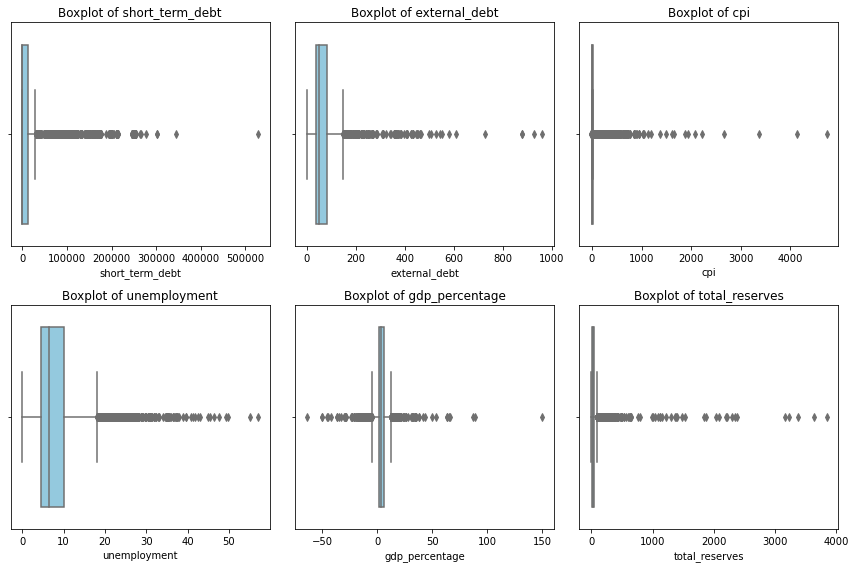

In [11]:
# xác định outlier
import seaborn as sns
import matplotlib.pyplot as plt
# Đặt kích thước của figure và số lượng subplot
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(12, 8))
# Flatten ma trận các axes thành một list để dễ truy cập
axes = axes.flatten()
variables = ['short_term_debt', 'external_debt', 'cpi', 'unemployment', 'gdp_percentage', 'total_reserves']
# Vẽ boxplot cho từng biến
for i, var in enumerate(variables):
    sns.boxplot(x=cleaned_data[var], color='skyblue', ax=axes[i])
    axes[i].set_title('Boxplot of {}'.format(var))
for j in range(len(variables), len(axes)):
    fig.delaxes(axes[j])
plt.tight_layout()
plt.show()


In [12]:
# xóa outlier theo các chuyên gia khi khủng hoảng tài chính xảy ra tỉ lệ nợ ngắn hạn trên tổng lượng dự trữ có thể 100-500% 
# tôi sẽ xóa trên 1000%
# Xác định các dòng có cleaned_data['short_term_debt'] > 1000 và gán giá trị NaN cho các dòng đó
cleaned_data.loc[cleaned_data['short_term_debt'] > 600, 'short_term_debt'] = pd.NA
# Loại bỏ các dòng có giá trị NaN trong cleaned_data['short_term_debt']
cleaned_data.dropna(subset=['short_term_debt'], inplace=True)
#tỷ lệ nước ngoài cao có thể là khủng hoảng tài chính và đây là 1 trong những dữ liệu quan trọng để dự đoán khủng hoảng tài chính vậy nên tôi sẽ không xóa
#CPI trên 2000% có thể bị coi là vô lí nên tôi sẽ tiến hành xóa những dữ liệu này
cleaned_data.loc[cleaned_data['cpi'] > 600, 'cpi'] = pd.NA
# Loại bỏ các dòng có giá trị NaN trong cleaned_data['short_term_debt']
cleaned_data.dropna(subset=['cpi'], inplace=True)
#xóa cho total_rserves
cleaned_data.loc[cleaned_data['total_reserves'] > 600, 'total_reserves'] = pd.NA
# Loại bỏ các dòng có giá trị NaN trong cleaned_data['short_term_debt']
cleaned_data.dropna(subset=['total_reserves'], inplace=True)
#xóa cho external_debt
cleaned_data.loc[cleaned_data['external_debt'] > 500, 'external_debt'] = pd.NA
# Loại bỏ các dòng có giá trị NaN trong cleaned_data['short_term_debt']
cleaned_data.dropna(subset=['external_debt'], inplace=True)
cleaned_data

,Country Code,Country Name,Year,short_term_debt,external_debt,total_reserves,cpi,unemployment,gdp_percentage,financial crisis
0,AFG,Afghanistan,1991,70.799264,208.581427,7.238129,2.474635,34.9800,1.661940,0.0
13,AFG,Afghanistan,2004,4.030371,54.900116,31.373527,13.982214,5.4700,1.414118,0.0
17,AFG,Afghanistan,2008,0.603634,21.212133,141.900322,26.418664,2.4950,3.924984,0.0
18,AFG,Afghanistan,2009,0.500545,20.036725,171.996793,-6.811161,8.9346,21.390528,0.0
19,AFG,Afghanistan,2010,2.035235,15.333497,211.936351,2.178538,6.7260,14.362441,0.0
...,...,...,...,...,...,...,...,...,...,...
5729,ZWE,Zimbabwe,2011,313.740187,59.052303,8.933358,3.466130,5.3680,14.620207,0.0
5730,ZWE,Zimbabwe,2012,423.560539,58.310639,6.474181,3.725327,7.9804,15.744877,0.0
5731,ZWE,Zimbabwe,2013,578.509439,48.889447,5.641502,1.634950,4.3800,3.196731,0.0
5739,ZWE,Zimbabwe,2021,445.839103,49.629058,6.095538,98.546105,9.5400,8.468017,0.0


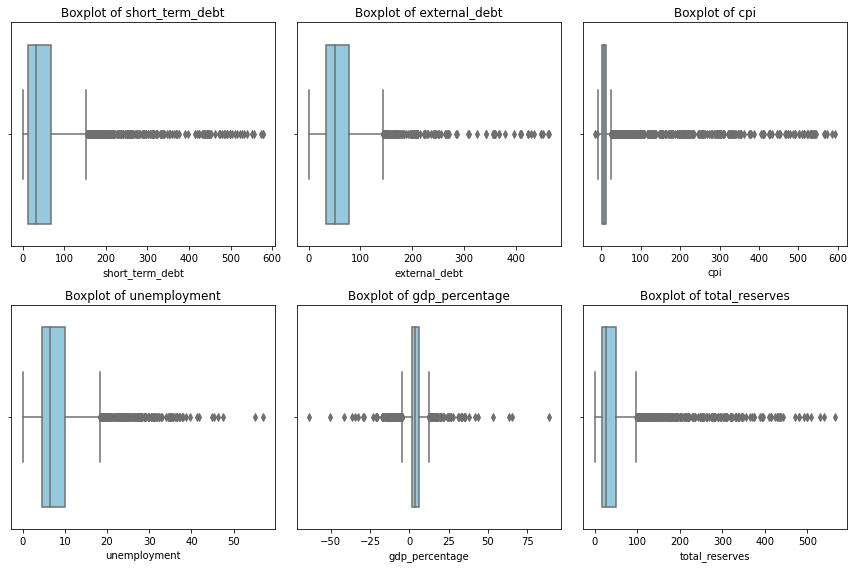

In [13]:
# xác định outlier
import seaborn as sns
import matplotlib.pyplot as plt

# Đặt kích thước của figure và số lượng subplot
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(12, 8))

# Flatten ma trận các axes thành một list để dễ truy cập
axes = axes.flatten()

# List các biến cần vẽ boxplot
variables = ['short_term_debt', 'external_debt', 'cpi', 'unemployment', 'gdp_percentage', 'total_reserves']

# Vẽ boxplot cho từng biến
for i, var in enumerate(variables):
    sns.boxplot(x=cleaned_data[var], color='skyblue', ax=axes[i])
    axes[i].set_title('Boxplot of {}'.format(var))

# Xoá các subplot không sử dụng
for j in range(len(variables), len(axes)):
    fig.delaxes(axes[j])

# Tinh chỉnh layout
plt.tight_layout()
plt.show()


In [14]:
#EDA
#thống kê mô tả
df = cleaned_data.drop(columns=['Country Code', 'Country Name'])
stats_df = df.describe()
stats_df

,Year,short_term_debt,external_debt,total_reserves,cpi,unemployment,gdp_percentage,financial crisis
count,3874.000000,3874.000000,3874.000000,3874.000000,3874.000000,3874.000000,3874.000000,3874.000000
mean,2007.347186,52.738046,65.586122,46.251968,24.375162,8.870610,3.610833,0.038720
std,9.469208,71.206563,52.928702,59.309340,70.675332,7.375192,5.777616,0.192951
min,1991.000000,0.000000,0.463882,0.273598,-16.859691,0.039000,-64.047107,0.000000
25%,1999.000000,11.796626,32.881617,16.651150,2.474635,4.660650,1.646640,0.000000
50%,2007.000000,30.840840,51.432189,27.159095,5.382166,6.548000,3.777223,0.000000
75%,2015.000000,68.850640,77.038421,49.224182,11.372081,10.146750,6.015984,0.000000
max,2023.000000,578.639149,463.917774,565.568935,594.540387,57.000000,88.957666,1.000000


In [15]:
cleaned_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 3874 entries, 0 to 5741
Data columns (total 10 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Country Code      3874 non-null   object 
 1   Country Name      3874 non-null   object 
 2   Year              3874 non-null   int32  
 3   short_term_debt   3874 non-null   float64
 4   external_debt     3874 non-null   float64
 5   total_reserves    3874 non-null   float64
 6   cpi               3874 non-null   float64
 7   unemployment      3874 non-null   float64
 8   gdp_percentage    3874 non-null   float64
 9   financial crisis  3874 non-null   float64
dtypes: float64(7), int32(1), object(2)
memory usage: 317.8+ KB


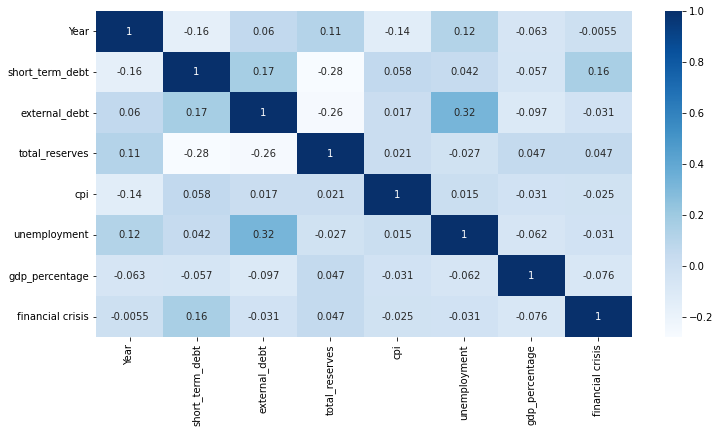

In [16]:
plt.figure(figsize=(12,6))
sns.heatmap(df.corr(),annot=True,cmap='Blues')
plt.show()

In [17]:
import plotly.express as px
#CPI các nước qua các năm
fig=px.line(cleaned_data.sort_values(by='Year'),x='Year',y='cpi',animation_frame='Country Name',labels={'inflation_annual_cpi':'cpi inflation rate'},animation_group='Year',color='Country Name',markers=True,template='plotly_dark',title='<b> Country wise Annual inflation rate over Years')
fig.update_traces(showlegend=False)

In [18]:
fig=px.line(cleaned_data.sort_values(by='Year'),x='Year',y='unemployment',animation_frame='Country Name',labels={'exch_usd':'exchange rate usd'},animation_group='Year',color='Country Name',markers=True,template='plotly_dark',title='<b> Unempoyment over Years')
fig.update_traces(showlegend=False)

In [19]:
fig=px.line(cleaned_data.sort_values(by='Year'),x='Year',y='gdp_percentage',animation_frame='Country Name',labels={'gdp_percentage'},animation_group='Year',color='Country Name',markers=True,template='plotly_dark',title='gdp_percentage over Years')
fig.update_traces(showlegend=False)

In [20]:
px.bar(cleaned_data,x='Country Name',y='cpi',color='cpi',animation_frame='Year',text='cpi',labels={'inflation_annual_cpi':'cpi inflation rate'},animation_group='Country Name',template='plotly_dark',title='<b> Inflation rate in every countries')

In [21]:
px.bar(cleaned_data,x='Country Name',y='unemployment',color='unemployment',animation_frame='Year',text='unemployment',labels={'unemployment'},animation_group='Country Name',template='plotly_dark',title='unemployment in every countries')

In [22]:
px.bar(cleaned_data,x='Country Name',y='gdp_percentage',color='gdp_percentage',animation_frame='Year',text='gdp_percentage',labels={'gdp_percentage'},animation_group='Country Name',template='plotly_dark',title='gdp_percentage in every countries')

In [23]:
px.bar(cleaned_data,x='Country Name',y='short_term_debt',color='short_term_debt',animation_frame='Year',text='short_term_debt',labels={'short_term_debt'},animation_group='Country Name',template='plotly_dark',title='short_term_debt in every countries')

In [24]:
px.histogram(cleaned_data,x='financial crisis',color='financial crisis',color_discrete_map={'1':'red','0':'Blue'},template='plotly_dark')

In [25]:
px.choropleth(cleaned_data.sort_values(by='Year'),locations='Country Code',animation_frame='Year',labels={'CPI','Country Code','Country Name'},animation_group='Country Name',color='cpi',color_continuous_scale=px.colors.sequential.Plasma,title='CPI in world',template='plotly_dark')

In [26]:
px.choropleth(cleaned_data.sort_values(by='Year'),locations='Country Code',animation_frame='Year',labels={'unemployment','Country Code','Country Name'},animation_group='Country Name',color='unemployment',color_continuous_scale=px.colors.sequential.Plasma,title='unemployment in world',template='plotly_dark')

In [27]:
px.choropleth(cleaned_data.sort_values(by='Year'),locations='Country Code',animation_frame='Year',labels={'gdp_percentage','Country Code','Country Name'},animation_group='Country Name',color='gdp_percentage',color_continuous_scale=px.colors.sequential.Plasma,title='gdp_percentage in world',template='plotly_dark')

In [28]:
df

,Year,short_term_debt,external_debt,total_reserves,cpi,unemployment,gdp_percentage,financial crisis
0,1991,70.799264,208.581427,7.238129,2.474635,34.9800,1.661940,0.0
13,2004,4.030371,54.900116,31.373527,13.982214,5.4700,1.414118,0.0
17,2008,0.603634,21.212133,141.900322,26.418664,2.4950,3.924984,0.0
18,2009,0.500545,20.036725,171.996793,-6.811161,8.9346,21.390528,0.0
19,2010,2.035235,15.333497,211.936351,2.178538,6.7260,14.362441,0.0
...,...,...,...,...,...,...,...,...
5729,2011,313.740187,59.052303,8.933358,3.466130,5.3680,14.620207,0.0
5730,2012,423.560539,58.310639,6.474181,3.725327,7.9804,15.744877,0.0
5731,2013,578.509439,48.889447,5.641502,1.634950,4.3800,3.196731,0.0
5739,2021,445.839103,49.629058,6.095538,98.546105,9.5400,8.468017,0.0


In [29]:
df_bk=cleaned_data.copy()


In [30]:
from sklearn.preprocessing import LabelEncoder
le=LabelEncoder()
for col in df.columns:
    if df[col].dtype=='object':
        df[col]=le.fit_transform(df[col])

In [31]:
x=df.drop('financial crisis',axis=1)
y=df['financial crisis']

In [32]:
from imblearn.over_sampling import RandomOverSampler
from sklearn.preprocessing import LabelEncoder
le=LabelEncoder()
for col in df.columns:
    if df[col].dtype=='object':
        df[col]=le.fit_transform(df[col])

oversample=RandomOverSampler(sampling_strategy=0.15)
x_over,y_over=oversample.fit_resample(x,y)
print(x_over)
print(y_over)

      Year  short_term_debt  external_debt  total_reserves        cpi  \
0     1991        70.799264     208.581427        7.238129   2.474635   
1     2004         4.030371      54.900116       31.373527  13.982214   
2     2008         0.603634      21.212133      141.900322  26.418664   
3     2009         0.500545      20.036725      171.996793  -6.811161   
4     2010         2.035235      15.333497      211.936351   2.178538   
...    ...              ...            ...             ...        ...   
4277  1998       425.028486     100.372073        9.281248   2.912621   
4278  2007        32.765707      35.669060       38.515030   6.406563   
4279  2022        88.332273      34.359847        7.819767  19.873860   
4280  1992        18.474300      51.918718       56.181480   1.012231   
4281  2007        20.939431      32.759185      115.010744   9.007299   

      unemployment  gdp_percentage  
0          34.9800        1.661940  
1           5.4700        1.414118  
2           

In [33]:
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test=train_test_split(x_over,y_over,test_size=0.30,random_state=42)
x_train.shape,x_test.shape,y_train.shape,y_test.shape

((2997, 7), (1285, 7), (2997,), (1285,))

In [34]:
from sklearn.preprocessing import MinMaxScaler
mmscaler=MinMaxScaler(feature_range=(0,1))
x_train=mmscaler.fit_transform(x_train)
x_test=mmscaler.fit_transform(x_test)
x_train=pd.DataFrame(x_train)
x_test=pd.DataFrame(x_test)

In [35]:
a={'Model Name':[],'True Positive':[],'False Negative':[],'False Positive':[],'True Negative':[],'Accuracy':[],'Precision':[],'Recall':[],'F1 Score':[],'Specificity':[],'MCC':[],'ROC_AUC_Score':[],'Balanced Accuracy':[]}
result=pd.DataFrame(a)
result

,Model Name,True Positive,False Negative,False Positive,True Negative,Accuracy,Precision,Recall,F1 Score,Specificity,MCC,ROC_AUC_Score,Balanced Accuracy


Model Name:  LogisticRegression()
Confusion matrix : 
 [[  20  148]
 [  20 1097]]
Outcome values : 
 20 148 20 1097
Classification report : 
               precision    recall  f1-score   support

           1       0.50      0.12      0.19       168
           0       0.88      0.98      0.93      1117

    accuracy                           0.87      1285
   macro avg       0.69      0.55      0.56      1285
weighted avg       0.83      0.87      0.83      1285

Accuracy : 86.9 %
Precision : 50.0 %
Recall : 11.9 %
F1 Score : 0.192
Specificity or True Negative Rate : 98.2 %
Balanced Accuracy : 55.0 %
MCC : MCC
roc_auc_score: 0.551


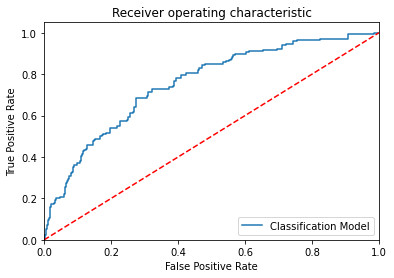

-----------------------------------------------------------------------------------------------------
Model Name:  DecisionTreeClassifier()
Confusion matrix : 
 [[  74   94]
 [  91 1026]]
Outcome values : 
 74 94 91 1026
Classification report : 
               precision    recall  f1-score   support

           1       0.45      0.44      0.44       168
           0       0.92      0.92      0.92      1117

    accuracy                           0.86      1285
   macro avg       0.68      0.68      0.68      1285
weighted avg       0.85      0.86      0.86      1285

Accuracy : 85.6 %
Precision : 44.8 %
Recall : 44.0 %
F1 Score : 0.444
Specificity or True Negative Rate : 91.9 %
Balanced Accuracy : 68.0 %
MCC : MCC
roc_auc_score: 0.68


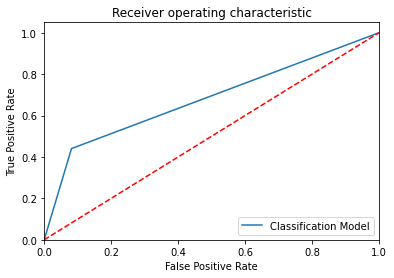

-----------------------------------------------------------------------------------------------------
Model Name:  RandomForestClassifier()
Confusion matrix : 
 [[  61  107]
 [  11 1106]]
Outcome values : 
 61 107 11 1106
Classification report : 
               precision    recall  f1-score   support

           1       0.85      0.36      0.51       168
           0       0.91      0.99      0.95      1117

    accuracy                           0.91      1285
   macro avg       0.88      0.68      0.73      1285
weighted avg       0.90      0.91      0.89      1285

Accuracy : 90.8 %
Precision : 84.7 %
Recall : 36.3 %
F1 Score : 0.508
Specificity or True Negative Rate : 99.0 %
Balanced Accuracy : 67.6 %
MCC : MCC
roc_auc_score: 0.677


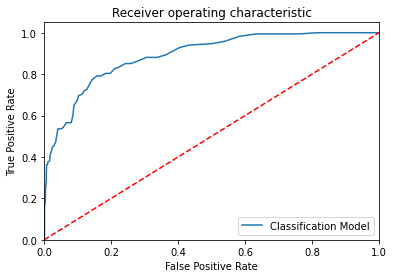

-----------------------------------------------------------------------------------------------------
Model Name:  ExtraTreesClassifier()
Confusion matrix : 
 [[  31  137]
 [   3 1114]]
Outcome values : 
 31 137 3 1114
Classification report : 
               precision    recall  f1-score   support

           1       0.91      0.18      0.31       168
           0       0.89      1.00      0.94      1117

    accuracy                           0.89      1285
   macro avg       0.90      0.59      0.62      1285
weighted avg       0.89      0.89      0.86      1285

Accuracy : 89.1 %
Precision : 91.2 %
Recall : 18.5 %
F1 Score : 0.307
Specificity or True Negative Rate : 99.7 %
Balanced Accuracy : 59.1 %
MCC : MCC
roc_auc_score: 0.591


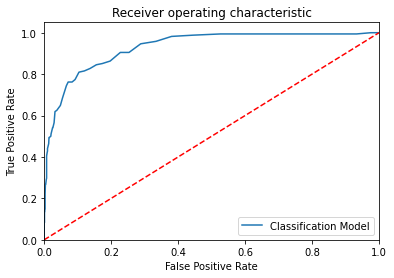

-----------------------------------------------------------------------------------------------------
Model Name:  KNeighborsClassifier()
Confusion matrix : 
 [[ 91  77]
 [150 967]]
Outcome values : 
 91 77 150 967
Classification report : 
               precision    recall  f1-score   support

           1       0.38      0.54      0.44       168
           0       0.93      0.87      0.89      1117

    accuracy                           0.82      1285
   macro avg       0.65      0.70      0.67      1285
weighted avg       0.85      0.82      0.84      1285

Accuracy : 82.3 %
Precision : 37.8 %
Recall : 54.2 %
F1 Score : 0.445
Specificity or True Negative Rate : 86.6 %
Balanced Accuracy : 70.4 %
MCC : MCC
roc_auc_score: 0.704


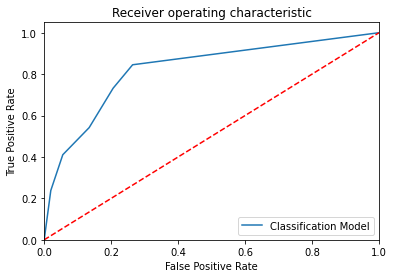

-----------------------------------------------------------------------------------------------------
Model Name:  SVC(probability=True)
Confusion matrix : 
 [[  22  146]
 [  15 1102]]
Outcome values : 
 22 146 15 1102
Classification report : 
               precision    recall  f1-score   support

           1       0.59      0.13      0.21       168
           0       0.88      0.99      0.93      1117

    accuracy                           0.87      1285
   macro avg       0.74      0.56      0.57      1285
weighted avg       0.85      0.87      0.84      1285

Accuracy : 87.5 %
Precision : 59.5 %
Recall : 13.1 %
F1 Score : 0.215
Specificity or True Negative Rate : 98.7 %
Balanced Accuracy : 55.9 %
MCC : MCC
roc_auc_score: 0.559


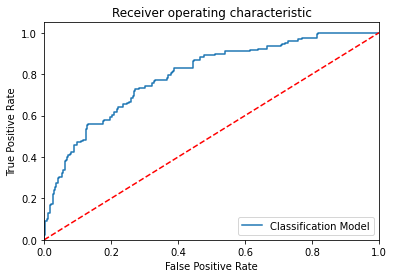

-----------------------------------------------------------------------------------------------------
Model Name:  BaggingClassifier(n_estimators=100)
Confusion matrix : 
 [[  70   98]
 [  38 1079]]
Outcome values : 
 70 98 38 1079
Classification report : 
               precision    recall  f1-score   support

           1       0.65      0.42      0.51       168
           0       0.92      0.97      0.94      1117

    accuracy                           0.89      1285
   macro avg       0.78      0.69      0.72      1285
weighted avg       0.88      0.89      0.88      1285

Accuracy : 89.4 %
Precision : 64.8 %
Recall : 41.7 %
F1 Score : 0.507
Specificity or True Negative Rate : 96.6 %
Balanced Accuracy : 69.2 %
MCC : MCC
roc_auc_score: 0.691


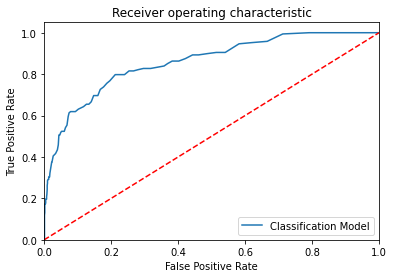

-----------------------------------------------------------------------------------------------------
Model Name:  GradientBoostingClassifier()
Confusion matrix : 
 [[  56  112]
 [  50 1067]]
Outcome values : 
 56 112 50 1067
Classification report : 
               precision    recall  f1-score   support

           1       0.53      0.33      0.41       168
           0       0.91      0.96      0.93      1117

    accuracy                           0.87      1285
   macro avg       0.72      0.64      0.67      1285
weighted avg       0.86      0.87      0.86      1285

Accuracy : 87.4 %
Precision : 52.8 %
Recall : 33.3 %
F1 Score : 0.409
Specificity or True Negative Rate : 95.5 %
Balanced Accuracy : 64.4 %
MCC : MCC
roc_auc_score: 0.644


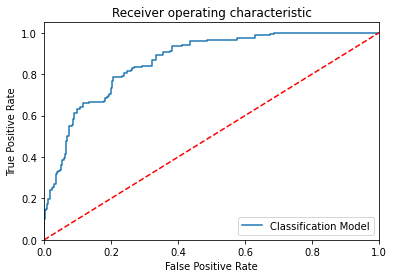

-----------------------------------------------------------------------------------------------------
[LightGBM] [Info] Number of positive: 390, number of negative: 2607
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001652 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1563
[LightGBM] [Info] Number of data points in the train set: 2997, number of used features: 7
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.130130 -> initscore=-1.899809
[LightGBM] [Info] Start training from score -1.899809
Model Name:  LGBMClassifier()
Confusion matrix : 
 [[  30  138]
 [  22 1095]]
Outcome values : 
 30 138 22 1095
Classification report : 
               precision    recall  f1-score   support

           1       0.58      0.18      0.27       168
           0       0.89      0.98      0.93      1117

    accuracy                           0.88

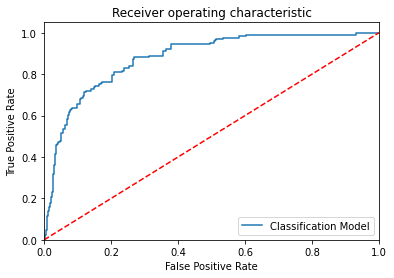

-----------------------------------------------------------------------------------------------------
Model Name:  GaussianNB()
Confusion matrix : 
 [[  57  111]
 [ 110 1007]]
Outcome values : 
 57 111 110 1007
Classification report : 
               precision    recall  f1-score   support

           1       0.34      0.34      0.34       168
           0       0.90      0.90      0.90      1117

    accuracy                           0.83      1285
   macro avg       0.62      0.62      0.62      1285
weighted avg       0.83      0.83      0.83      1285

Accuracy : 82.8 %
Precision : 34.1 %
Recall : 33.9 %
F1 Score : 0.34
Specificity or True Negative Rate : 90.2 %
Balanced Accuracy : 62.0 %
MCC : MCC
roc_auc_score: 0.62


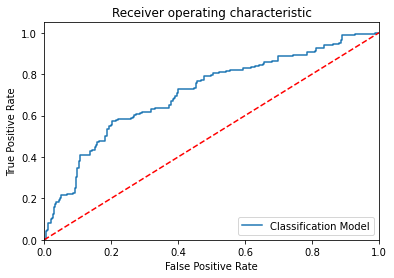

-----------------------------------------------------------------------------------------------------


In [36]:
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import GradientBoostingClassifier
import lightgbm as lgb
from sklearn.naive_bayes import GaussianNB
ModelLR = LogisticRegression()
ModelDC = DecisionTreeClassifier()
ModelRF = RandomForestClassifier()
ModelET = ExtraTreesClassifier()
ModelKNN = KNeighborsClassifier(n_neighbors=5)
ModelSVM = SVC(probability=True)
modelBAG = BaggingClassifier(base_estimator=None, n_estimators=100, max_samples=1.0, max_features=1.0,bootstrap=True, bootstrap_features=False, oob_score=False, warm_start=False,n_jobs=None, random_state=None, verbose=0)
ModelGB = GradientBoostingClassifier(loss='deviance', learning_rate=0.1,n_estimators=100, subsample=1.0,criterion='friedman_mse', min_samples_split=2, min_samples_leaf=1,min_weight_fraction_leaf=0.0, max_depth=3, min_impurity_decrease=0.0, init=None,random_state=None,max_features=None, verbose=0, max_leaf_nodes=None,warm_start=False,validation_fraction=0.1, n_iter_no_change=None, tol=0.0001, ccp_alpha=0.0)
ModelLGB = lgb.LGBMClassifier()
ModelGNB = GaussianNB()
MM = [ModelLR, ModelDC, ModelRF, ModelET,ModelKNN, ModelSVM, modelBAG,ModelGB, ModelLGB, ModelGNB]
for models in MM:
    
    # Fit the model
    
    models.fit(x_train, y_train)
    
    # Prediction
    
    y_pred = models.predict(x_test)
    y_pred_prob = models.predict_proba(x_test)
    
    # Print the model name
    
    print('Model Name: ', models)
    
    # confusion matrix in sklearn

    from sklearn.metrics import confusion_matrix
    from sklearn.metrics import classification_report
    # actual values

    actual = y_test

    # predicted values

    predicted = y_pred

    # confusion matrix

    matrix = confusion_matrix(actual,predicted, labels=[1,0],sample_weight=None, normalize=None)
    print('Confusion matrix : \n', matrix)
    tp, fn, fp, tn = confusion_matrix(actual,predicted,labels=[1,0]).reshape(-1)
    print('Outcome values : \n', tp, fn, fp, tn)

    # classification report for precision, recall f1-score and accuracy

    C_Report = classification_report(actual,predicted,labels=[1,0])
    print('Classification report : \n', C_Report)

    # calculating the metrics

    sensitivity = round(tp/(tp+fn), 3);
    specificity = round(tn/(tn+fp), 3);
    accuracy = round((tp+tn)/(tp+fp+tn+fn), 3);
    balanced_accuracy = round((sensitivity+specificity)/2, 3);
    precision = round(tp/(tp+fp), 3);
    f1Score = round((2*tp/(2*tp + fp + fn)), 3);

    # Matthews Correlation Coefficient (MCC). Range of values of MCC lie between -1 to +1. 
    # A model with a score of +1 is a perfect model and -1 is a poor model
    import math
    from math import sqrt

    mx = (tp+fp) * (tp+fn) * (tn+fp) * (tn+fn)
    MCC = round(((tp * tn) - (fp * fn)) / sqrt(mx), 3)
    print('Accuracy :', round(accuracy*100, 2),'%')
    print('Precision :', round(precision*100, 2),'%')
    print('Recall :', round(sensitivity*100,2), '%')
    print('F1 Score :', f1Score)
    print('Specificity or True Negative Rate :', round(specificity*100,2), '%'  )
    print('Balanced Accuracy :', round(balanced_accuracy*100, 2),'%')
    print('MCC :', 'MCC')
     # Area under ROC curve 

    from sklearn.metrics import roc_curve, roc_auc_score

    print('roc_auc_score:', round(roc_auc_score(actual, predicted), 3))
    
    # ROC Curve
    
    from sklearn.metrics import roc_auc_score
    from sklearn.metrics import roc_curve
    logit_roc_auc = roc_auc_score(actual, predicted)
    fpr, tpr, thresholds = roc_curve(actual, models.predict_proba(x_test)[:,1])
    plt.figure()
     # plt.plot(fpr, tpr, label='Logistic Regression (area = %0.2f)' % logit_roc_auc)
    plt.plot(fpr, tpr, label= 'Classification Model' % logit_roc_auc)
    plt.plot([0, 1], [0, 1],'r--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic')
    plt.legend(loc="lower right")
    plt.savefig('Log_ROC')
    plt.show()
    print('-----------------------------------------------------------------------------------------------------')
    #----------------------------------------------------------------------------------------------------------
    new_row = {'Model Name' : models,
               'True Positive' : tp, 
               'False Negative' : fn, 
               'False Positive' : fp,
               'True Negative' : tn,
               'Accuracy' : accuracy,
               'Precision' : precision,
               'Recall' : sensitivity,
               'F1 Score' : f1Score,
               'Specificity' : specificity,
               'MCC':MCC,
               'ROC_AUC_Score':roc_auc_score(actual, predicted),
               'Balanced Accuracy':balanced_accuracy}
    result = pd.concat([result, pd.DataFrame([new_row])], ignore_index=True)

In [37]:
result

,Model Name,True Positive,False Negative,False Positive,True Negative,Accuracy,Precision,Recall,F1 Score,Specificity,MCC,ROC_AUC_Score,Balanced Accuracy
0,LogisticRegression(),20.0,148.0,20.0,1097.0,0.869,0.500,0.119,0.192,0.982,0.196,0.550571,0.550
1,DecisionTreeClassifier(),74.0,94.0,91.0,1026.0,0.856,0.448,0.440,0.444,0.919,0.362,0.679504,0.680
2,"(DecisionTreeClassifier(max_features='auto', r...",61.0,107.0,11.0,1106.0,0.908,0.847,0.363,0.508,0.990,0.518,0.676624,0.676
3,"(ExtraTreeClassifier(random_state=1752575604),...",31.0,137.0,3.0,1114.0,0.891,0.912,0.185,0.307,0.997,0.382,0.590919,0.591
4,KNeighborsClassifier(),91.0,77.0,150.0,967.0,0.823,0.378,0.542,0.445,0.866,0.352,0.703689,0.704
5,SVC(probability=True),22.0,146.0,15.0,1102.0,0.875,0.595,0.131,0.215,0.987,0.237,0.558762,0.559
6,(DecisionTreeClassifier(random_state=103501162...,70.0,98.0,38.0,1079.0,0.894,0.648,0.417,0.507,0.966,0.465,0.691323,0.692
7,([DecisionTreeRegressor(criterion='friedman_ms...,56.0,112.0,50.0,1067.0,0.874,0.528,0.333,0.409,0.955,0.354,0.644285,0.644
8,LGBMClassifier(),30.0,138.0,22.0,1095.0,0.875,0.577,0.179,0.273,0.980,0.272,0.579438,0.580
9,GaussianNB(),57.0,111.0,110.0,1007.0,0.828,0.341,0.339,0.340,0.902,0.241,0.620404,0.620


In [38]:
models={'models':['LogisticRegression','DecisionTreeClassifier','RandomForestClassifier','ExtraTreesClassifier','KNeighborsClassifier','SVC','BaggingClassifier','GradientBoostingClassifier','LGBMClassifier','GaussianNB']}
out=pd.DataFrame(models)
out['Accuracy']=result['Accuracy']
out['Precision']=result['Precision']
out['Recall']=result['Recall']
out['F1 Score']=result['F1 Score']
out['True Positive']=result['True Positive']
out['False Negative']=result['False Negative']
out['False Positive']=result['False Positive']
out['True Negative']=result['True Negative']
out.sort_values(by=['Accuracy','F1 Score','Recall','Precision'],ascending=False,inplace=True)
out.reset_index(drop=True,inplace=True)
out

,models,Accuracy,Precision,Recall,F1 Score,True Positive,False Negative,False Positive,True Negative
0,RandomForestClassifier,0.908,0.847,0.363,0.508,61.0,107.0,11.0,1106.0
1,BaggingClassifier,0.894,0.648,0.417,0.507,70.0,98.0,38.0,1079.0
2,ExtraTreesClassifier,0.891,0.912,0.185,0.307,31.0,137.0,3.0,1114.0
3,LGBMClassifier,0.875,0.577,0.179,0.273,30.0,138.0,22.0,1095.0
4,SVC,0.875,0.595,0.131,0.215,22.0,146.0,15.0,1102.0
5,GradientBoostingClassifier,0.874,0.528,0.333,0.409,56.0,112.0,50.0,1067.0
6,LogisticRegression,0.869,0.500,0.119,0.192,20.0,148.0,20.0,1097.0
7,DecisionTreeClassifier,0.856,0.448,0.440,0.444,74.0,94.0,91.0,1026.0
8,GaussianNB,0.828,0.341,0.339,0.340,57.0,111.0,110.0,1007.0
9,KNeighborsClassifier,0.823,0.378,0.542,0.445,91.0,77.0,150.0,967.0


In [39]:
y_pred=ModelRF.predict(x_test)
out=pd.DataFrame({'actual':y_test,'predicted':y_pred})
out=df_bk.merge(out,left_index=True,right_index=True)
out['actual'].replace(0,'no_crisis',inplace=True)
out['actual'].replace(1,'crisis',inplace=True)
out['predicted'].replace(0,'no_crisis',inplace=True)
out['predicted'].replace(1,'crisis',inplace=True)
out[['Country Name','Year','short_term_debt','external_debt','cpi','unemployment','gdp_percentage','total_reserves','predicted']].sample(10)

C:\Users\DELL\AppData\Local\Temp\ipykernel_8732\1736421662.py:4: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.



C:\Users\DELL\AppData\Local\Temp\ipykernel_8732\1736421662.py:6: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True

,Country Name,Year,short_term_debt,external_debt,cpi,unemployment,gdp_percentage,total_reserves,predicted
1406,Dominica,2011,6.841637,57.178676,1.131231,10.2406,-0.223551,28.925410,no_crisis
3885,North Macedonia,2015,41.046171,69.420692,-0.299920,26.3950,3.855865,36.512462,crisis
668,Bosnia and Herzegovina,1999,8.759282,44.489976,129.911483,7.1576,9.600000,18.781066,no_crisis
1780,France,2022,47.920987,51.110619,5.222367,7.3080,2.454758,16.658035,no_crisis
4212,Poland,2012,5.668311,48.259608,3.560372,10.0880,1.545222,26.924810,no_crisis
1220,Costa Rica,2023,43.523021,222.357352,36.373446,8.3250,3.636093,44.259771,no_crisis
2759,Kuwait,2011,68.688910,48.917390,4.839403,7.8042,9.628407,20.031164,no_crisis
1023,Chad,1991,30.958803,32.889752,3.193875,10.0318,8.535137,20.066925,no_crisis
3307,Mauritius,1998,0.000000,30.922589,6.810793,5.7556,6.071940,45.018584,no_crisis
246,Armenia,2006,28.627191,31.988189,2.892357,11.0318,13.200000,50.115771,no_crisis


In [40]:
# Giả sử df_bk là DataFrame chứa toàn bộ dữ liệu
vietnam_data = df_bk[df_bk['Country Name'] == 'Viet Nam']

# Lấy các cột đầu vào cho mô hình
input_columns = ['short_term_debt', 'external_debt', 'cpi', 'unemployment', 'gdp_percentage', 'total_reserves','financial crisis']
vietnam_input = vietnam_data[input_columns]
# Sử dụng mô hình để dự đoán cho dữ liệu Việt Nam
if not vietnam_input.empty:
    vietnam_pred = ModelRF.predict(vietnam_input)

    # Tạo DataFrame kết quả với các cột cần thiết
    vietnam_out = vietnam_data.copy()
    vietnam_out['predicted'] = vietnam_pred

    # Thay thế nhãn số bằng nhãn dạng chuỗi
    vietnam_out['predicted'].replace(0, 'no_crisis', inplace=True)
    vietnam_out['predicted'].replace(1, 'crisis', inplace=True)

    # Hiển thị kết quả
    print(vietnam_out[['Country Name', 'Year', 'short_term_debt', 'external_debt', 'cpi', 'unemployment', 'gdp_percentage', 'total_reserves', 'predicted']].sample(10))
else:
    print("No data available for Viet Nam.")

     Country Name  Year  short_term_debt  external_debt         cpi  \
5675     Viet Nam  2023        70.799264     208.581427    2.474635   
5663     Viet Nam  2011        79.631506      32.377825   18.677732   
5644     Viet Nam  1992         2.930855     255.919607  227.969045   
5657     Viet Nam  2005        22.544702      32.865160    8.284572   
5654     Viet Nam  2002        16.472063      38.681631    3.830828   
5660     Viet Nam  2008        17.599003      27.549788   23.115448   
5651     Viet Nam  1999        71.428026      82.832609    4.117102   
5674     Viet Nam  2022        44.088565      37.704187    3.156507   
5673     Viet Nam  2021        30.385495      40.258390    1.834716   
5669     Viet Nam  2017        44.621191      41.570125    3.520257   

      unemployment  gdp_percentage  total_reserves  predicted  
5675       34.9800        1.661940        7.238129  no_crisis  
5663        0.9990        6.413169       24.925922  no_crisis  
5644        5.2768        

E:\Anaconda\lib\site-packages\sklearn\base.py:443: UserWarning:

X has feature names, but RandomForestClassifier was fitted without feature names

C:\Users\DELL\AppData\Local\Temp\ipykernel_8732\2219104677.py:16: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.



